In [1]:
#-*-coding:utf-8-*-
# Configuration with C:\Users\root\.jupyter\custom\custom.css

# Analysis of South Korean Journalism Framing on COVID-19 and 21st South Korea General Election
## :Topic model and Semantic Network Analysis Leveraging

# Introduction

TOBE

# Steps in 1: Initiative

Get libraries and install

- Define libraries and make alias
- Define global variable as like final or static

In [2]:
#-*-coding:utf-8-*-
import sys
'''
#!{sys.executable} -m conda update --all
!{sys.executable} -m pip install anaconda gensim
!{sys.executable} -m pip install anaconda memory_profiler
!{sys.executable} -m pip install anaconda -U Okt
!{sys.executable} -m pip install anaconda -U konlpy
!{sys.executable} -m pip install anaconda -U pandas
!{sys.executable} -m pip install anaconda -U numpy
!{sys.executable} -m pip install anaconda -U pandas
!{sys.executable} -m pip install anaconda -U scikit-learn
!{sys.executable} -m pip install anaconda wordcloud
!{sys.executable} -m pip install  -U  matplotlib
!{sys.executable} -m conda install -c conda-forge pandas-profiling
!{sys.executable} -m pip install -U pyLDAvis
!{sys.executable} -m pip install jupyter_contrib_nbextensions jupyter contrib
'''
import os 
import gc
import time
import jpype
import konlpy
import logging
import warnings
import re        
import glob
import csv
import pandas_profiling
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from pandas_profiling import ProfileReport
from glob import glob
from pandas import Series, DataFrame
from sklearn.metrics import accuracy_score
from matplotlib import font_manager, rc
font_name = font_manager.FontProperties(fname="c:/Windows/Fonts/gulim.ttc").get_name()
rc('font', family=font_name)



# Global variable configuration
global DEFAULT_PATH                     # Default file path
global DEFAULT_OUTPUT_PATH              # Default output file path
global LOW_TRAININGDATA_PATH            # Low level training data path
global COVID19_DEFAULT_TITLE            # COVID-19 default title
global ELECTION_DEFAULT_TITLE           # 21th Election default title 
global LOW_TRAININGDATA_C19             # COVID-19 low level training file
global LOW_TRAININGDATA_ELECTION        # 21th Election low level training file
global COVID19_DF                       # COVID-19 re-inspected dataframe file
global ELECTION_DF                      # 21th Election re-inspected dataframe file
global COVID19_MORPHS_STEMMED_TOKEN     # COVID-19 stemmed metamorphose token file
global ELECTION_MORPHS_STEMMED_TOKEN    # 21th Election stemmed metamorphose token file
global COVID19_TITLE_SM                 # COVID-19 title sparse matrix, Vectorized word Dictionary file
global COVID19_CONTENTS_SM              # COVID-19 contents sparse matrix, Vectorized word Dictionary file
global ELECTION_TITLE_SM                # 21th Election title sparse matrix, Vectorized word Dictionary file
global ELECTION_CONTENTS_SM             # 21th Election contents sparse matrix, Vectorized word Dictionary file
global COVID19_TITLE_TOPIC_MODEL        # COVID-19 title, LDA topic model file
global COVID19_CONTENTS_TOPIC_MODEL     # COVID-19 contents, LDA topic model file
global ELECTION_TITLE_TOPIC_MODEL       # 21th Election title, LDA topic model file
global ELECTION_CONTENTS_TOPIC_MODEL    # 21th Election contents, LDA topic model file
global LOW_STOPWORDS                    # Stop word
global DEFAULT_ENCODE                   # For byte
global HANGUL_ENCODE                    # For file name and contents
global JAP_ENCODE                       # For OS path
global POS

DEFAULT_PATH = r'C:\Users\root\Documents\0. The Cyber University of Korea\Graduated School\Semester 3\Thesis'
DEFAULT_OUTPUT_PATH = 'output'
LOW_TRAININGDATA_PATH = 'data' 
COVID19_DEFAULT_TITLE = 'COVID-19' 
ELECTION_DEFAULT_TITLE = '21st South Korea General Election' 
LOW_TRAININGDATA_C19 = 'training_data_c19.csv'
LOW_TRAININGDATA_ELECTION = 'training_data_election.csv'
COVID19_DF = 'c19_df.pickle' 
ELECTION_DF = 'e21_df.pickle' 
COVID19_MORPHS_STEMMED_TOKEN = 'c19_morphs_stemmed_token.pickle'
ELECTION_MORPHS_STEMMED_TOKEN = 'e21_morphs_stemmed_token.pickle' 
COVID19_TITLE_SM = 'c19_title_sparse_matrix.mtx'
COVID19_CONTENTS_SM = 'c19_contents_sparse_matrix.mtx'
ELECTION_TITLE_SM = 'e21_title_sparse_matrix.mtx' 
ELECTION_CONTENTS_SM = 'e21_contents_sparse_matrix.mtx'
COVID19_TITLE_TOPIC_MODEL  = 'c19_title_lda.pickle.mtx' 
COVID19_CONTENTS_TOPIC_MODEL  = 'c19_contents_lda.pickle.mtx' 
ELECTION_TITLE_TOPIC_MODEL  = 'e21_title_lda.pickle.mtx'
ELECTION_CONTENTS_TOPIC_MODEL  = 'e21_contents_lda.pickle.mtx'

# From https://www.ranks.nl/stopwords/korean and add specific words
LOW_STOPWORDS = 'stopwords.txt' 
# 일반 명사, 고유 명사, 의존 명사
POS = ['NNG','NNP','NNB']

# Default encoding
DEFAULT_ENCODE = 'UTF-8' 
# Encode for Hangul cp949(Euc-kr)
HANGUL_ENCODE = 'cp949'
# Encode for Japnese CP932(Shift-JIS)
JAP_ENCODE = 'cp932'

%load_ext memory_profiler
%memit
gc.collect()

peak memory: 222.50 MiB, increment: 0.07 MiB


0

## 1.1. Configurations & Commons

In [3]:
'''
Configurations
'''
t0 = time.time()
# Log configuration
log = logging.getLogger("thesis_hunyoung_joung")
log.setLevel(logging.DEBUG)
formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s',"%Y-%m-%d %H:%M:%S")
log.propagate = True
# Output to console
console_handler = logging.StreamHandler()
console_handler.setFormatter(formatter)
console_handler.setLevel(logging.DEBUG)
# Output to file
file_handler = logging.FileHandler(filename = os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, \
    "thesis_hunyoung_joung_run.log"))
file_handler.setFormatter(formatter)
file_handler.setLevel(logging.DEBUG)
# Record logs to file and show to console
log.addHandler(console_handler)
log.addHandler(file_handler)
# Begin logging 
log.info("Default path? {}".format(DEFAULT_PATH))

# Plotting configuration
#plt.rc('font', family=DEFAULT_FONT) 
plt.rcParams["figure.figsize"] = (12, 9)

'''
Commons
'''
# Word cloud
def show_word_cloud(words, cnt):
    w_cloud = WordCloud(font_path='c:\Windows\Fonts\gulim.ttc', width=600, height=350, max_words=cnt, background_color='white')\
        .generate(words)
    plt.figure(figsize=(15,10))
    plt.imshow(w_cloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()  
    
# File reader    
def file_read_support(file, columns):
    pattern = '[\r|\n]'
    with open(file, 'r', encoding=DEFAULT_ENCODE) as f: 
        words_list = []
        for line in f.readlines():
            words_list.append(re.sub(pattern=pattern, repl='', string=line))
        df_ = pd.DataFrame(words_list, columns=columns)
    return df_

# Document cleaner
def cleaner(doc):  
# Remove email
    doc = re.sub(re.compile(r'[\[a-zA-Z0-9\_.+-\]+@\[a-zA-Z0-9-\]+.\[a-zA-Z0-9-.\]+)]'), ' ', doc)
# Remove url
    doc = re.sub(re.compile('(http|ftp|https)://(?:[-\w.]|(?:\da-fA-F]{2}))+'), ' ', doc)
# Remove typo
    doc = re.sub(re.compile(r'([ㄱ-ㅎㅏ-ㅣ])+'), ' ', doc)
# Remove html tag
    doc = re.sub(re.compile(r'<[^>]*>'), ' ', doc)
# Remove line feed
    doc = re.sub(re.compile(r'[\r|\n]'), ' ', doc)
# Remove specific symbols
    doc = re.sub(re.compile(r'[^\w\s]'), ' ', doc)
# Revmove double space
    doc = re.sub(re.compile(r'\s+'), ' ', doc)
    return(doc)
'''
Training data analysis for inspection and exploration

Low data structure
뉴스 식별자,일자,언론사,기고자,제목,통합 분류1,통합 분류2,통합 분류3,사건/사고 분류1,사건/사고 분류2,사건/사고 분류3,
인물,위치,기관,키워드,특성추출(가중치순 상위 50개),본문,URL,분석제외 여부

'id','date','media','auth','title','category1','category2','category3','incident1','incident2','incident3',
'rel_person','rel_location','rel_org','key_words','feature','contents','url','flag'
'''

'''
Input: subject title, O/S path + file name 
Output: 
    - show: 
        low data shape and size (maximum, minimum, mean, standard deviation, median) 
        target data shape and size (maximum, minimum, mean, standard deviation, median) 
    - return: dataframe [['id','date','media','auth','title','category1','category2','category3', 'contents'](n)]
'''
def csv_file_support(subject_title, file):
# Low data shape
    col_cnt = 0
    row_cnt = 0
# Acquired target data list
    training_date_list = []
    with open(file, 'r', encoding=DEFAULT_ENCODE, newline='') as f_obj: 
        csv_reader = csv.reader(f_obj)
        headers = next(csv_reader)
        col_cnt = len(headers)
        file_name = os.path.basename(f_obj.name)     
        for row in csv_reader:   
            row_cnt += 1
            cell_cnt = 0
            row_list = []
            for col in row:
# id
                if cell_cnt == 0: 
                    id_len_ = len(col)
                    if id_len_ < 1:
                        row_list.append(None)
                    else:
                        row_list.append(str(col))
# date 
                if cell_cnt == 1: 
                    date_len_ = len(col)
                    if date_len_ < 1:
                        row_list.append(None)
                    else:
                        row_list.append(str(col))
# media                
                if cell_cnt == 2: 
                    media_len_ = len(col)
                    if media_len_ < 1:
                        row_list.append(None)
                    else:
                        row_list.append(col)
# auth                   
                if cell_cnt == 3: 
                    auth_len_ = len(col)
                    if auth_len_ < 1 and media_len_ < 1:
                        row_list.append(None)
                    elif auth_len_ < 1:
                        row_list.append(None)
                    else:
                        row_list.append(col)
# title            
                if cell_cnt == 4: 
                    title_len_ = len(col)
                    if title_len_ < 1:
                        row_list.append(None)
                    else:
                        row_list.append(re.sub('[\r|\n]', repl=' ', string=col))
# category1
                if cell_cnt == 5: 
                    category1_len_ = len(col)
                    if category1_len_ < 1:
                        row_list.append(None)
                    else:
                        row_list.append(col)
# category2                      
                if cell_cnt == 6: 
                    category2_len_ = len(col)
                    if category2_len_ < 1:
                        row_list.append(None)
                    else:
                        row_list.append(col)
# category3                       
                if cell_cnt == 7: 
                    category3_len_ = len(col)
                    if category3_len_ < 1:
                        row_list.append(None)
                    else:
                        row_list.append(col)       
# contents     
                if cell_cnt == 8:
                    contents_len_ = len(col)
                    if contents_len_ < 1:
                        row_list.append(None)
                    else:
                        row_list.append(re.sub('[\r|\n]', repl=' ', string=col))
                cell_cnt += 1    
            training_date_list.append(row_list)
            # End of column loop
        # End of row loop
    # End of file open
# Dataframe
    df = pd.DataFrame(training_date_list, columns =['id','date','media','auth','title','category1','category2','category3','contents'])
    df['format_date'] = df['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d') if x != None else None) 
# Low data shape
    log.info("{}: Low-Level data shape? Headers={}, Column count={:,.0f}, Row count={:,.0f}"\
             .format(file_name, headers, row_cnt, col_cnt))    
    log.info("{}: Data shape? \nData information={} \nMissing Value={}".format(subject_title, df.info(), df.isnull().sum()))
    return df
# End of function

# Common logging
t1 = time.time()
%load_ext memory_profiler
%memit
log.debug("execution time? {:,.0f} sec".format(t1-t0))
log.debug("Garbage status? {:,.0f}".format(gc.collect()))

2021-03-25 20:04:42 - thesis_hunyoung_joung - INFO - Default path? C:\Users\root\Documents\0. The Cyber University of Korea\Graduated School\Semester 3\Thesis


The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


2021-03-25 20:04:47 - thesis_hunyoung_joung - DEBUG - execution time? 0 sec
2021-03-25 20:04:47 - thesis_hunyoung_joung - DEBUG - Garbage status? 0


peak memory: 223.15 MiB, increment: 0.01 MiB


# Steps in 2: Training Data Preprocessing

## 2-1: Low Data Acquisition

Data Acquisition

- Read all of the article's files that extracted from the 'bigkinds.or.kr'
- Add to the defined array COVID-19/Election separately 

In [4]:
t0 = time.time()
# Get default low model data using on os path 
low_training_data_path = os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH)
log.info("Low level trining data path? {}".format(low_training_data_path))
# Define array for COVID19
covid_list = []
# Define array for election
election_list = []
# Find out all of target files
file_names = glob(os.path.join(low_training_data_path, r'*.csv'))
file_names.sort()
# While reading all of the files to detect a file name and to input to each array
for file_name in file_names:
    simple_file_name = file_name.split("\\")
    if re.search('covid19', file_name) != None: 
        covid_list.append(pd.read_csv(file_name, encoding=DEFAULT_ENCODE))
    else:
        election_list.append(pd.read_csv(file_name, encoding=DEFAULT_ENCODE))
# Set dataframe to each objective
covid_df = pd.concat(covid_list, axis=0, ignore_index=True)
election_df = pd.concat(election_list, axis=0, ignore_index=True)
# Transfer to CSV within 19 headers
covid_df[['뉴스 식별자','일자','언론사','기고자','제목','통합 분류1','통합 분류2','통합 분류3','본문']]\
    .to_csv(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, LOW_TRAININGDATA_C19), \
    header=['id','date','media','auth','title','category1','category2','category3','contents'], index=False)   
election_df[['뉴스 식별자','일자','언론사','기고자','제목','통합 분류1','통합 분류2','통합 분류3','본문']]\
    .to_csv(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, LOW_TRAININGDATA_ELECTION), \
    header=['id','date','media','auth','title','category1','category2','category3','contents'], index=False)
del covid_list, election_list
# Common logging
t1 = time.time()
%load_ext memory_profiler
%memit
log.debug("execution time? {:,.0f} sec".format(t1-t0))
log.debug("Garbage status? {:,.0f}".format(gc.collect()))

2021-03-25 20:04:47 - thesis_hunyoung_joung - INFO - Low level trining data path? C:\Users\root\Documents\0. The Cyber University of Korea\Graduated School\Semester 3\Thesis\data


The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


2021-03-25 20:05:06 - thesis_hunyoung_joung - DEBUG - execution time? 14 sec
2021-03-25 20:05:06 - thesis_hunyoung_joung - DEBUG - Garbage status? 0


peak memory: 973.95 MiB, increment: 0.00 MiB


## 2-2: Exploratory Data Analysis

### 2-2-1: Data Inspection and Exploration

#### Data analysis
- Low data shape:\
    Headers, Row count, Column count
- Low data profile
- Data size

#### Inspection
- Missing value
- Duplicate value

#### 2-2-1-1: COVID-19

In [5]:
'''
EDA -> 전처리
COVID19 및 선거관련으로, 언론사별로 생산한 기사의 갯수가 상이하여, 기사를 가장 많이 생산한 언론사와 적은 언론사의 편차를 줄인다.
따라서, 가장 많이 생산한 언론사의 기사수가 200이고, 적은 언론의 기사가 100 이라면, 적은 언론사의 기사를 2배 증가 시킨다.
1. COVID19 및 선거관련 각각의 총 기사수를 날짜별/문장수별로 분석 -> 날짜별은 큰 의미는 없지만, 특정한 패턴, 즉, 선거관련하여 기사량이 증가한다면, 이는 선거와 관련있다라고 할 수 있다. 또한, 문장수는 만약 ... 어떻게 처리할까?
2. COVID19 및 선거관련 각 언론사의 기사수를 총량/날짜/기사의 문장수 분석 -> 기사수의 총량은 증가시킨다. 날짜의 전처리를 없다. 만약, 언론사별 문장수의 편차가 크다면...?
3. 각각을 시각화
Exploratory data analysis
Analyze the model data feature and drop data profiling to HTML
'''
t0 = time.time()
# Get dataframe of COVID-19
c19_df = csv_file_support(COVID19_DEFAULT_TITLE, os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, LOW_TRAININGDATA_C19))
# COVID-19 dataframe profiling
c19_profile_inspection = ProfileReport(c19_df, title="{} Inspection Profiling Report".format(COVID19_DEFAULT_TITLE), explorative=True)
# c19_profile.to_notebook_iframe() # Doesn't work on GibHub
c19_profile_inspection.to_file("c19_profile_inspection.html")

# Common logging
t1 = time.time()
%load_ext memory_profiler
%memit
log.debug("execution time? {:,.0f} sec".format(t1-t0))
log.debug("Garbage status? {:,.0f}".format(gc.collect()))

2021-03-25 20:05:35 - thesis_hunyoung_joung - INFO - training_data_c19.csv: Low-Level data shape? Headers=['id', 'date', 'media', 'auth', 'title', 'category1', 'category2', 'category3', 'contents'], Column count=173,551, Row count=9
2021-03-25 20:05:35 - thesis_hunyoung_joung - INFO - COVID-19: Data shape? 
Data information=None 
Missing Value=id              2203
date            2203
media           2203
auth           11517
title           2203
category1        754
category2      39708
category3      72294
contents        2203
format_date     2203
dtype: int64


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 173551 entries, 0 to 173550
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   id           171348 non-null  object        
 1   date         171348 non-null  object        
 2   media        171348 non-null  object        
 3   auth         162034 non-null  object        
 4   title        171348 non-null  object        
 5   category1    172797 non-null  object        
 6   category2    133843 non-null  object        
 7   category3    101257 non-null  object        
 8   contents     171348 non-null  object        
 9   format_date  171348 non-null  datetime64[ns]
dtypes: datetime64[ns](1), object(9)
memory usage: 13.2+ MB



The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


2021-03-25 20:06:08 - thesis_hunyoung_joung - DEBUG - execution time? 57 sec
2021-03-25 20:06:08 - thesis_hunyoung_joung - DEBUG - Garbage status? 0


peak memory: 1364.59 MiB, increment: 0.00 MiB


#### 2-2-1-2: 21st General Election

In [6]:
t0 = time.time()
# Get dataframe of 21st general election
e21_df = csv_file_support(ELECTION_DEFAULT_TITLE, \
    os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, LOW_TRAININGDATA_ELECTION))
# 21st general election dataframe profiling
e21_profile_inspection = ProfileReport(e21_df, title="{} Inspection Profiling Report".format(ELECTION_DEFAULT_TITLE), \
    explorative=True)
# e21_profile.to_notebook_iframe() # Doesn't work on GibHub
e21_profile_inspection.to_file("e21_profile_inspection.html")
# Common logging
t1 = time.time()
%load_ext memory_profiler
%memit
log.debug("execution time? {:,.0f} sec".format(t1-t0))
log.debug("Garbage status? {:,.0f}".format(gc.collect()))

2021-03-25 20:06:18 - thesis_hunyoung_joung - INFO - training_data_election.csv: Low-Level data shape? Headers=['id', 'date', 'media', 'auth', 'title', 'category1', 'category2', 'category3', 'contents'], Column count=77,033, Row count=9
2021-03-25 20:06:18 - thesis_hunyoung_joung - INFO - 21st South Korea General Election: Data shape? 
Data information=None 
Missing Value=id                 0
date               0
media              0
auth            4842
title              0
category1          0
category2       9257
category3      29988
contents           0
format_date        0
dtype: int64


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77033 entries, 0 to 77032
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   id           77033 non-null  object        
 1   date         77033 non-null  object        
 2   media        77033 non-null  object        
 3   auth         72191 non-null  object        
 4   title        77033 non-null  object        
 5   category1    77033 non-null  object        
 6   category2    67776 non-null  object        
 7   category3    47045 non-null  object        
 8   contents     77033 non-null  object        
 9   format_date  77033 non-null  datetime64[ns]
dtypes: datetime64[ns](1), object(9)
memory usage: 5.9+ MB



The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


2021-03-25 20:06:37 - thesis_hunyoung_joung - DEBUG - execution time? 25 sec
2021-03-25 20:06:38 - thesis_hunyoung_joung - DEBUG - Garbage status? 0


peak memory: 1500.87 MiB, increment: 0.00 MiB


## 2-3: Data Reinspection and Confirmation

### 2-3-1: Cleaning & Normalization

Cleaning & Normalization

- Remove the row that has a missing value or the empty row case:\
    if in the case, id, date, title, media, and contents is 'None', then removed
- Remove duplicate row
- Reset index row

#### 2-3-1-1: COVID-19

In [7]:
import pickle
t0 = time.time()

log.info("Orginal dataframe?\n{}".format(c19_df.notnull().sum()))
# Drop row, if all cell has empty or id, date, title, media, and contents is 'None'
c19_df.dropna(subset=['id','date','media','title','contents'], inplace=True)
log.info("Removal: missing value?\n{}".format(c19_df.notnull().sum()))
# Remove duplicate row
c19_df.drop_duplicates(['id'], keep='first')
log.info("Removal: duplicate row?\n{}".format(c19_df.notnull().sum()))
# Reset index
c19_df.reset_index(inplace=True, drop=True) 
# Save dataframe
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, COVID19_DF), "wb+") as f:
    pickle.dump(c19_df, f)
del c19_df
# Common logging
t1 = time.time()
%load_ext memory_profiler
%memit
log.debug("execution time? {:,.0f} sec".format(t1-t0))
log.debug("Garbage status? {:,.0f}".format(gc.collect()))

2021-03-25 20:06:38 - thesis_hunyoung_joung - INFO - Orginal dataframe?
id             171348
date           171348
media          171348
auth           162034
title          171348
category1      172797
category2      133843
category3      101257
contents       171348
format_date    171348
dtype: int64
2021-03-25 20:06:38 - thesis_hunyoung_joung - INFO - Removal: missing value?
id             171348
date           171348
media          171348
auth           162034
title          171348
category1      171348
category2      133843
category3      101257
contents       171348
format_date    171348
dtype: int64
2021-03-25 20:06:38 - thesis_hunyoung_joung - INFO - Removal: duplicate row?
id             171348
date           171348
media          171348
auth           162034
title          171348
category1      171348
category2      133843
category3      101257
contents       171348
format_date    171348
dtype: int64


The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


2021-03-25 20:06:44 - thesis_hunyoung_joung - DEBUG - execution time? 2 sec
2021-03-25 20:06:44 - thesis_hunyoung_joung - DEBUG - Garbage status? 0


peak memory: 1583.72 MiB, increment: 0.00 MiB


#### 2-3-1-2: 21st General Election

In [8]:
import pickle
t0 = time.time()
log.info("Orginal dataframe?\n{}".format(e21_df.notnull().sum()))
# Drop row, if all cell has empty or id, date, title, media, and contents is 'None'
e21_df.dropna(subset=['id','date','media','title','contents'], inplace=True)
log.info("Removal: missing value?\n{}".format(e21_df.notnull().sum()))
# Remove duplicate row
e21_df.drop_duplicates(['id'], keep='first')
log.info("Removal: duplicate row?\n{}".format(e21_df.notnull().sum()))
# Reset index
e21_df.reset_index(inplace=True, drop=True) 
# Save dataframe
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, ELECTION_DF), "wb+") as f:
    pickle.dump(e21_df, f)
del e21_df
# Common logging
t1 = time.time()
%load_ext memory_profiler
%memit
log.debug("execution time? {:,.0f} sec".format(t1-t0))
log.debug("Garbage status? {:,.0f}".format(gc.collect()))

2021-03-25 20:06:44 - thesis_hunyoung_joung - INFO - Orginal dataframe?
id             77033
date           77033
media          77033
auth           72191
title          77033
category1      77033
category2      67776
category3      47045
contents       77033
format_date    77033
dtype: int64
2021-03-25 20:06:44 - thesis_hunyoung_joung - INFO - Removal: missing value?
id             77033
date           77033
media          77033
auth           72191
title          77033
category1      77033
category2      67776
category3      47045
contents       77033
format_date    77033
dtype: int64
2021-03-25 20:06:44 - thesis_hunyoung_joung - INFO - Removal: duplicate row?
id             77033
date           77033
media          77033
auth           72191
title          77033
category1      77033
category2      67776
category3      47045
contents       77033
format_date    77033
dtype: int64


The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


2021-03-25 20:06:49 - thesis_hunyoung_joung - DEBUG - execution time? 1 sec
2021-03-25 20:06:49 - thesis_hunyoung_joung - DEBUG - Garbage status? 0


peak memory: 1589.01 MiB, increment: 0.00 MiB


### 2-3-2: Data Reinspection and Confirmation

#### Data analysis
- Low data shape:\
    Headers, Row count, Column count
- Low data profile
- Data size

#### Reinspection
- Missing value
- Duplicate value
- Transition in the number of articles by month
- Transition in the number of articles at each media by month

##### 2-3-2-1: COVID-19


The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


2021-03-25 20:07:16 - thesis_hunyoung_joung - DEBUG - execution time? 23 sec
2021-03-25 20:07:16 - thesis_hunyoung_joung - DEBUG - Garbage status? 0


peak memory: 1977.89 MiB, increment: 0.00 MiB


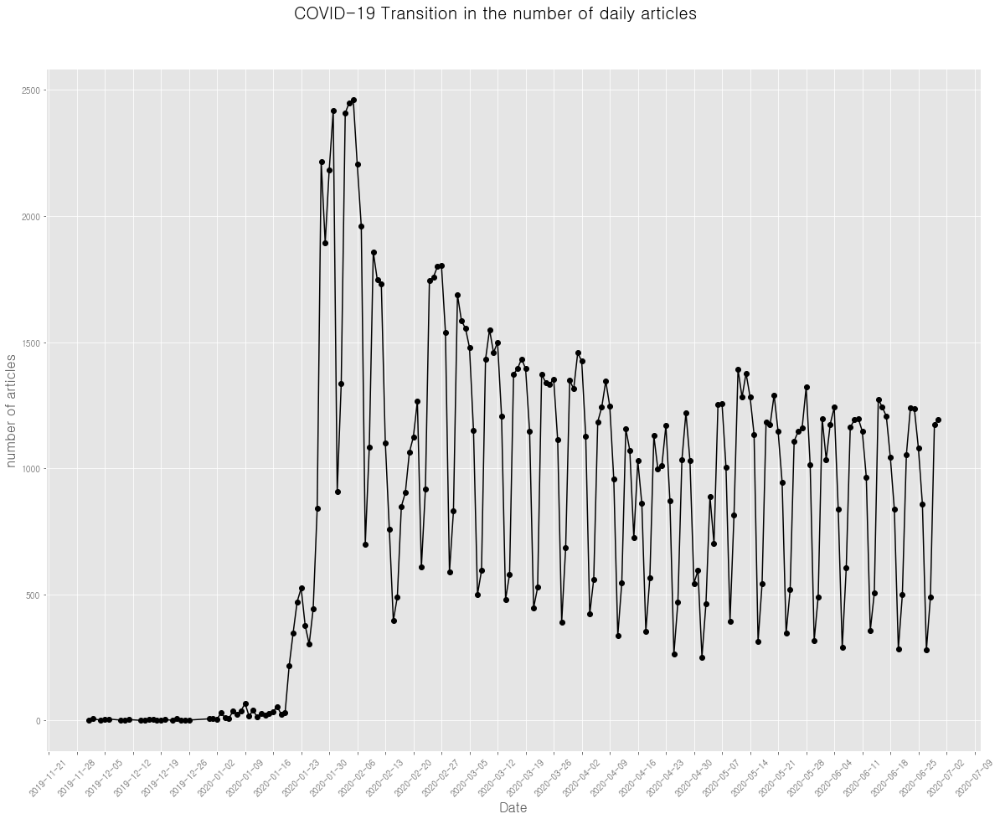

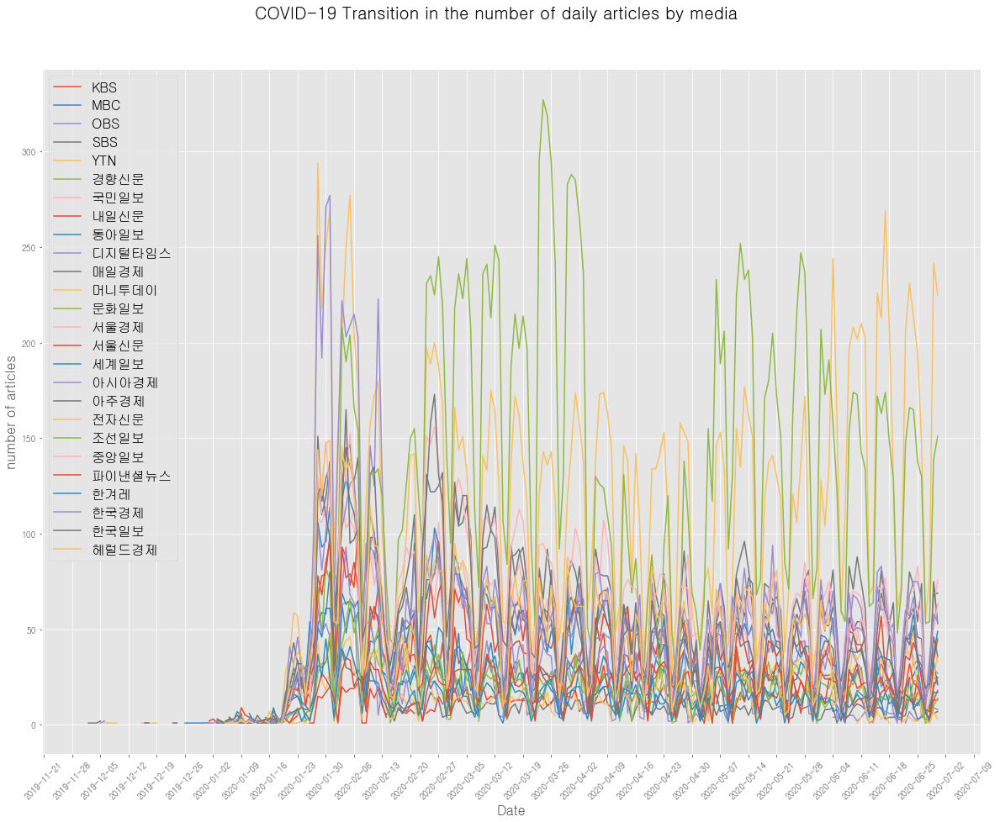

In [9]:
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.ticker as ticker
#from cycler import cycler
#from matplotlib.pyplot import cm

t0 = time.time()
# Load COVID-19 dataframe
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, COVID19_DF), "rb") as f:
    c19_df_reinspection = pickle.load(f)
    # COVID-19 dataframe profiling
    c19_profile = ProfileReport(c19_df_reinspection, title="{} Reinspection Profiling Report".format(COVID19_DEFAULT_TITLE)\
        .format(COVID19_DEFAULT_TITLE), explorative=True)
    # c19_profile.to_notebook_iframe() # Doesn't work on GibHub
    c19_profile.to_file("c19_profile_reinspection.html")
    # Transition in the number of articles by month 
    c19_df_mac = pd.pivot_table(c19_df_reinspection, values='date', index=['format_date'], aggfunc='count')
    c19_df_mac.columns = ['article_count']
    c19_df_mac.to_csv(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, 'reinspection_montly_data_c19.csv'),\
        index=True, encoding="utf-8-sig")
    # Plot
    plt.style.use('ggplot')
    mac_figure = plt.figure(figsize=(20,15))
    mac_figure.suptitle('{} Transition in the number of daily articles '\
        .format(COVID19_DEFAULT_TITLE), fontsize=20, position=(0.5, 0.95))
    plt.plot(c19_df_mac.index, c19_df_mac, '-ok') 
    plt.xticks(rotation=45)
    ax=plt.gca()
    ax.xaxis.set_major_locator(ticker.MultipleLocator(7))
    plt.xlabel('Date', fontsize=16)
    plt.ylabel('number of articles', fontsize=16)
  
    # Transition in the number of articles at each media by month
    c19_df_mac_bymedia = pd.pivot_table(c19_df_reinspection, values='date', index=['media','format_date'], aggfunc='count')
    c19_df_mac_bymedia.columns = ['article_count']
    c19_df_mac_bymedia.to_csv(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH,\
        'reinspection_montly_bymedia_data_c19.csv'), encoding="utf-8-sig")
    plt.style.use('ggplot')
    mac_figure = plt.figure(figsize=(20,15))
    mac_figure.suptitle('{} Transition in the number of daily articles by media'\
        .format(COVID19_DEFAULT_TITLE), fontsize=20, position=(0.5, 0.95))
    # (n) below should be number of curves to plot = count of media
    '''
    n = 26
    from matplotlib.cm import get_cmap
    viridisBig = cm.get_cmap("viridis", 512)  # type: matplotlib.colors.ListedColormap
    newcmp = ListedColormap(viridisBig(np.linspace(0.25, 0.75, 256)))
    colors = cmap.colors  # type: list
    '''
    # Rebind dataframe.index to the desired level of the MultiIndex use the level's integer value
    plt.plot(c19_df_mac_bymedia.unstack(level=0).index, c19_df_mac_bymedia.unstack(level=0)) 
    plt.xticks(rotation=45) # axes 45"  
    # Used to get the current Axes instance on the current figure matching the given keyword args, or create one.
    axes=plt.gca()
    #axes.set_prop_cycle(color=colors)
    axes.xaxis.set_major_locator(ticker.MultipleLocator(7)) # weekly base
    plt.xlabel('Date', fontsize=16)
    plt.ylabel('number of articles', fontsize=16)
    # get the first element of each tuple in a list
    plt.legend([a_tuple[1] for a_tuple in list(c19_df_mac_bymedia.unstack(level=0))], fontsize=16)

# Common logging
t1 = time.time()
%load_ext memory_profiler
%memit
log.debug("execution time? {:,.0f} sec".format(t1-t0))
log.debug("Garbage status? {:,.0f}".format(gc.collect()))

#### 2-3-2-2: 21st General Election


The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


2021-03-25 20:07:36 - thesis_hunyoung_joung - DEBUG - execution time? 14 sec
2021-03-25 20:07:36 - thesis_hunyoung_joung - DEBUG - Garbage status? 0


peak memory: 2150.81 MiB, increment: 0.00 MiB


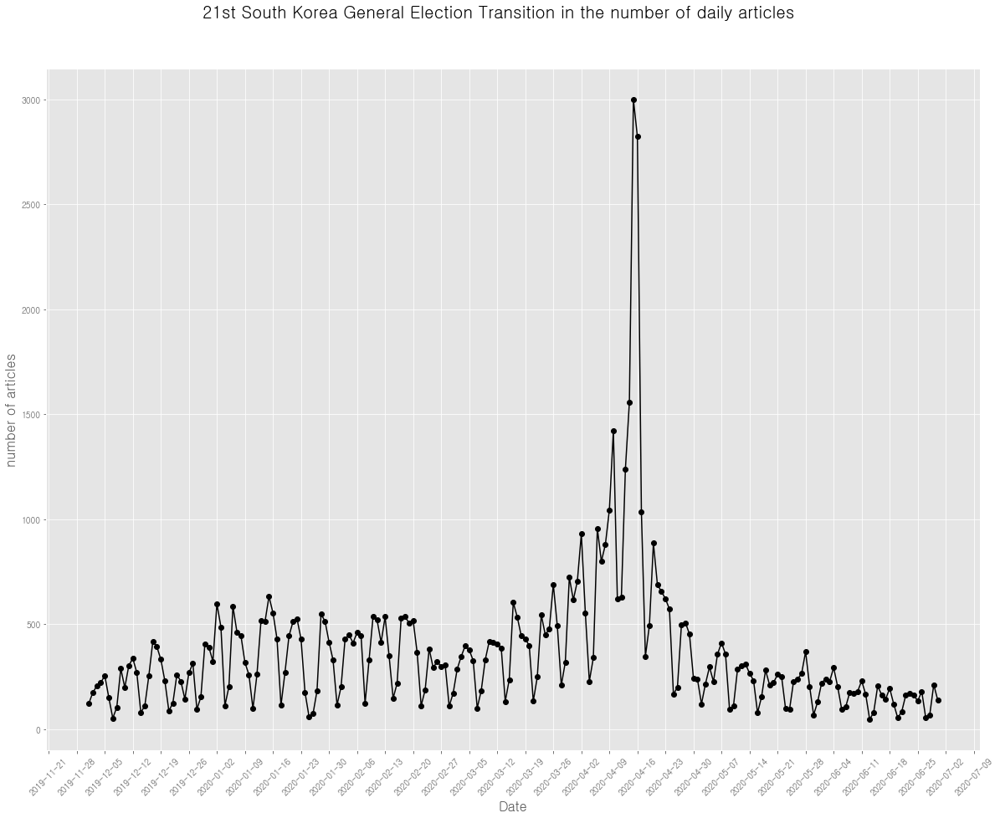

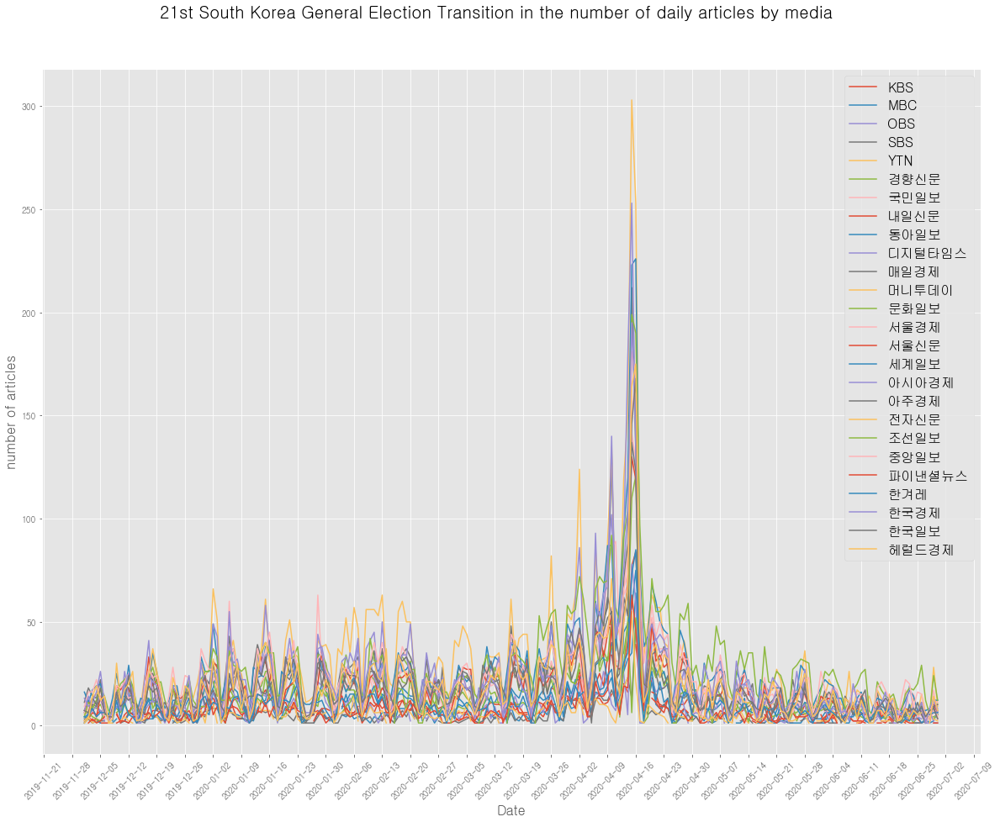

In [10]:
t0 = time.time()
# Load 21th election dataframe
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, ELECTION_DF), "rb") as f:
    e21_df_reinspection = pickle.load(f)
    # COVID-19 dataframe profiling
    e21_profile = ProfileReport(e21_df_reinspection, title="{} Reinspection Profiling Report".format(ELECTION_DEFAULT_TITLE)\
        .format(ELECTION_DEFAULT_TITLE), explorative=True)
    # e21_profile.to_notebook_iframe() # Doesn't work on GibHub
    e21_profile.to_file("e21_profile_reinspection.html")
    # Transition in the number of articles by month 
    e21_df_mac = pd.pivot_table(e21_df_reinspection, values='date', index=['format_date'], aggfunc='count')
    e21_df_mac.columns = ['article_count']
    c19_df_mac.to_csv(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, 'reinspection_montly_data_e21.csv'),\
        index=True, encoding="utf-8-sig")
    # Plot
    plt.style.use('ggplot')
    mac_figure = plt.figure(figsize=(20,15))
    mac_figure.suptitle('{} Transition in the number of daily articles'\
        .format(ELECTION_DEFAULT_TITLE), fontsize=20, position=(0.5, 0.95))
    plt.plot(e21_df_mac.index, e21_df_mac, '-ok') 
    plt.xticks(rotation=45)
    ax=plt.gca()
    ax.xaxis.set_major_locator(ticker.MultipleLocator(7))
    plt.xlabel('Date', fontsize=16)
    plt.ylabel('number of articles', fontsize=16)
  
    # Transition in the number of articles at each media by month
    e21_df_mac_bymedia = pd.pivot_table(e21_df_reinspection, values='date', index=['media','format_date'], aggfunc='count')
    e21_df_mac_bymedia.columns = ['media']
    e21_df_mac_bymedia.to_csv(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH,\
        'reinspection_montly_bymedia_data_e21.csv'), encoding="utf-8-sig")
    plt.style.use('ggplot')
    mac_figure = plt.figure(figsize=(20,15))
    mac_figure.suptitle('{} Transition in the number of daily articles by media'\
        .format(ELECTION_DEFAULT_TITLE), fontsize=20, position=(0.5, 0.95))
    # Rebind dataframe.index to the desired level of the MultiIndex use the level's integer value
    plt.plot(e21_df_mac_bymedia.unstack(level=0).index, e21_df_mac_bymedia.unstack(level=0)) 
    plt.xticks(rotation=45)
    axes=plt.gca()
    axes.xaxis.set_major_locator(ticker.MultipleLocator(7)) # weekly base
    plt.xlabel('Date', fontsize=16)
    plt.ylabel('number of articles', fontsize=16)
    # get the first element of each tuple in a list
    plt.legend([a_tuple[1] for a_tuple in list(e21_df_mac_bymedia.unstack(level=0))], fontsize=16)

# Common logging
t1 = time.time()
%load_ext memory_profiler
%memit
log.debug("execution time? {:,.0f} sec".format(t1-t0))
log.debug("Garbage status? {:,.0f}".format(gc.collect()))    

## 2-4: Tokenization

### 2-4-1: Construct Stopwords

In [11]:
'''
Construct stopwords dataframe.
i.e, stop_words_df['stop_word']
'''
t0 = time.time()
stop_words_df = file_read_support(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, LOW_STOPWORDS), ['stop_word'])
display(stop_words_df)
'''
try:
    log.info("Stop word? \r\n{}, \r\n{}".format(stop_words_df.info(), stop_words_df[:])) # df[:] -> row indexing, from first row
except:
    pass
'''    
# Common logging
t1 = time.time()
%load_ext memory_profiler
%memit
log.debug("execution time? {:,.0f} sec".format(t1-t0))
log.debug("Garbage status? {:,.0f}".format(gc.collect()))

,stop_word
0,아
1,휴
2,아이구
3,아이쿠
4,아이고
...,...
739,MBC
740,사진
741,김지영
742,머니


The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


2021-03-25 20:07:42 - thesis_hunyoung_joung - DEBUG - execution time? 0 sec
2021-03-25 20:07:42 - thesis_hunyoung_joung - DEBUG - Garbage status? 0


peak memory: 2133.97 MiB, increment: 0.00 MiB


### 2-4-2: Data Tokenization

- Acquire dataframe
- Cleaning
- Tokenizing and Stemming
- Stopword removal procedure
- Replace dataframe column with tokenized data
- Inspect tokenized data and visualize

#### 2-4-2-1: COVID-19

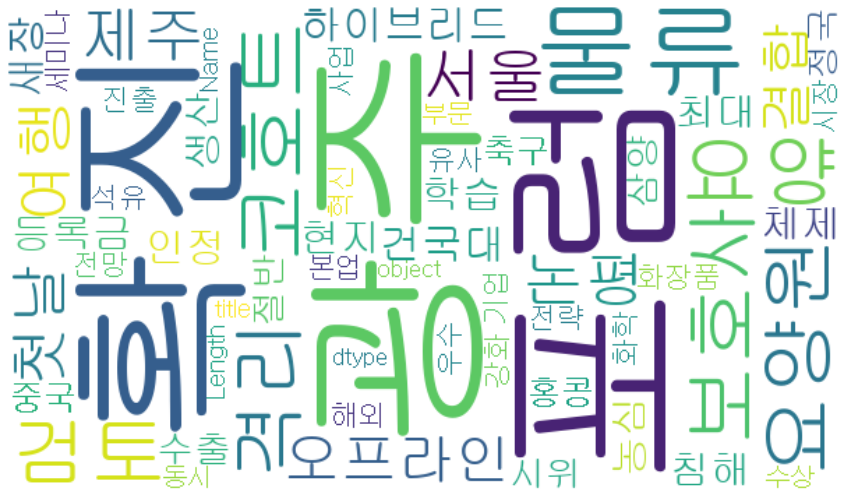

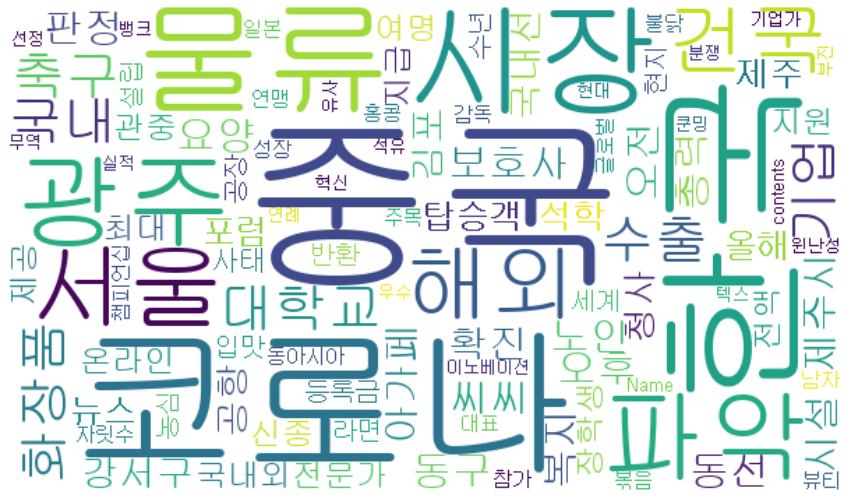

,id,date,media,auth,title,category1,category2,category3,contents,format_date
0,2100201.2020063023,20200630.0,머니투데이,김지영|기자,"광주,요양,보호사,확진,요양원,코호트,격리,검토",지역>강원,지역>광주,지역>경기,"광주,노인,복지,시설,요양,보호사,코로나,확진,판정,오후,광주,동구,씨씨,씨,아가페...",2020-06-30
1,2100201.2020063023,20200630.0,머니투데이,김지영|기자,"광주,확진,제주,여행,첫날",지역>제주,지역>광주,사회>사회일반,"제주시,동선,파악,총력,오전,서울,강서구,김포,공항,국내선,청사,탑승객,뉴스,제주,...",2020-06-30
2,1100701.2020063025,20200630.0,세계일보,남상훈,논평,국제>중국,국제>일본,국제>중동_아프리카,,2020-06-30
3,2100311.2020063023,20200630.0,서울경제,이지윤 기자,"서울,포럼,오프라인,결합,하이브리드,포럼,새장",IT_과학>인터넷_SNS,None,None,"올해,회,서울,포럼,해외,석학,전문가,랜,선,국내외,온라인,관중,여명,신종,코로나,...",2020-06-30
4,2100201.2020063023,20200630.0,머니투데이,김지영|기자,"건국대,등록금,최대,학습,침해,인정",사회>교육_시험,지역>경기,지역>전북,"최대,지원,전액,장학생,지급,건국,대학교,제공,건국,대학교,코로나,사태,등록금,반환...",2020-06-30
...,...,...,...,...,...,...,...,...,...,...
171343,2100501.201912192,20191219.0,파이낸셜뉴스,이설영,"농심,美,현지,생산,체제,수출,량,절반,삼양",경제>무역,경제>유통,경제>자동차,"세계,입맛,한국,라면,美,공장,설립,농심,현지,수년,간,자릿수,성장,불닭,볶음,면,...",2019-12-19
171344,2100701.2019120925,20191209.0,헤럴드경제,박승원 기자,"시위,정국,속,축구,홍콩,중국",스포츠>축구,스포츠>월드컵,국제>중국,"동아시아,축구,연맹,챔피언십,참가,한국,일본,홍콩,중국,남자,축구,대표,팀,감독,부...",2019-12-09
171345,2100601.2019120217,20191202.0,한국경제,경규민(gyumin@hankyung.com),"화장품,시장,전망,해외,진출,전략,세미나",경제>유통,경제>무역,None,"한국,화장품,시장,해외,수출,글로벌,뷰티,시장,주목,국내,화장품,시장,파악,수출,역...",2019-12-02
171346,2100601.2019120217,20191202.0,한국경제,김보형(kph21c@hankyung.com),"본업,유사,앞,석유,화학,사업,강화",경제>자원,지역>울산,경제>자동차,"이노베이션,칼,텍스,현대,뱅크,국내,정,유사,실적,부진,늪,미,중,무역,분쟁,석유,...",2019-12-02


The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


2021-03-25 21:19:29 - thesis_hunyoung_joung - DEBUG - execution time? 4,302 sec


peak memory: 3052.36 MiB, increment: -0.49 MiB


2021-03-25 21:19:29 - thesis_hunyoung_joung - DEBUG - Garbage status? 0


In [12]:
import pickle
from eunjeon import Mecab

mecab = Mecab()
t0 = time.time()

# Load COVID-19 dataframe
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, COVID19_DF), "rb") as f:
    c19_df_m = pickle.load(f)

    for idx, row in c19_df_m.iterrows():
# Cleaning 
        row.title = cleaner(row.title)
        row.contents = cleaner(row.contents)
# Tokenizing and stemming
        row.title = [v[0] for v in mecab.pos(row.title) if v[1] in POS]
        row.contents = [v[0] for v in mecab.pos(row.contents) if v[1] in POS]       
# Stopword process   
        row.title = [word for word in row.title if word not in stop_words_df.stop_word.values.tolist()]
        row.contents = [word for word in row.contents if word not in stop_words_df.stop_word.values.tolist()]
# Replace      
        c19_df_m.loc[idx, 'title'] = ','.join(row.title)
        c19_df_m.loc[idx, 'contents'] = ','.join(row.contents)
# Wordcloud        
show_word_cloud(str(c19_df_m['title']), 100) 
show_word_cloud(str(c19_df_m['contents']), 100) 

# Save     
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, \
    COVID19_MORPHS_STEMMED_TOKEN), "wb+") as f:
    pickle.dump(c19_df_m, f)
    f.close()
    display(c19_df_m)    

del c19_df_m
# Common logging
t1 = time.time()
%load_ext memory_profiler
%memit
log.debug("execution time? {:,.0f} sec".format(t1-t0))
log.debug("Garbage status? {:,.0f}".format(gc.collect()))

#### 2-4-2-2: 21st General Election

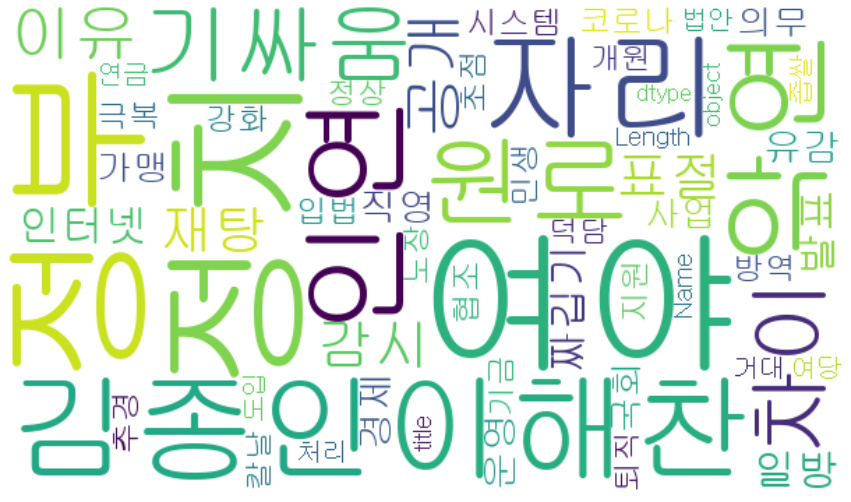

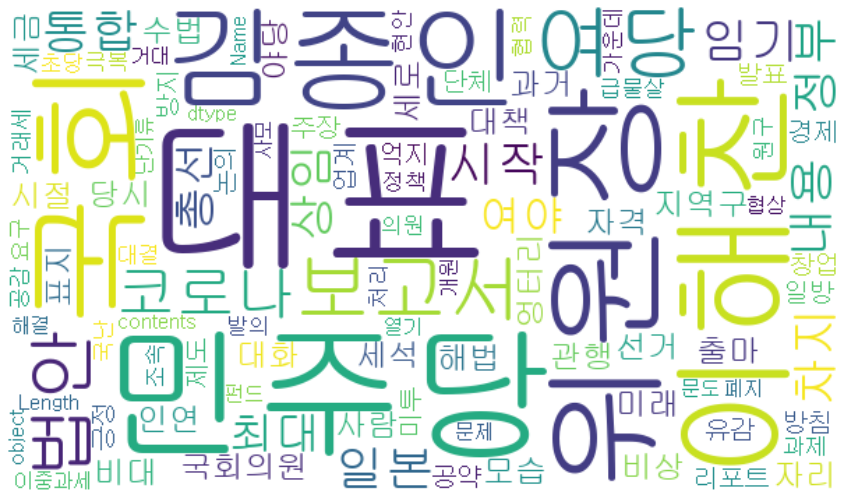

,id,date,media,auth,title,category1,category2,category3,contents,format_date
0,8100301.20200603,20200603,SBS,백운 기자,"전,내,자리,이해찬,김종인,악연",정치>국회_정당,정치>선거,정치>청와대,"국회의원,선거,지역구,출마,이해찬,민주당,대표,김종인,통합,비대,위원장,당시,모습,...",2020-06-03
1,8100201.202006031,20200603,MBC,김재영,"인연,정치,원로,날,선,기싸움",정치>국회_정당,정치>청와대,정치>북한,"이해찬,민주당,대표,김종인,미래,통합,비상,대책,위원장,인연,사람,대표,자격,대화,...",2020-06-03
2,8100201.202006031,20200603,MBC,최경재,"석,차이,여야,이유",정치>국회_정당,정치>청와대,None,"국회,임기,시작,상임,위원장,자리,해법,야당,과거,세석,차지,여당,시절,관행,여당,...",2020-06-03
3,8100201.202006031,20200603,MBC,김세로,"공개,감시,표절,재탕,인터넷,짜깁기",정치>국회_정당,정치>북한,None,"엉터리,보고서,수법,보고서,내용,표지,대표,보고서,세금,법안,돈,김,세로,리포트,유...",2020-06-03
4,8100101.202006031,20200603,KBS,황현택,"日,정부,일방,발표,유감,경제,文,정부,日",국제>일본,None,None,"정부,방침,일본,정부,일방,발표,유감,억지,주장,일본,최대,경제,단체,대표,총선,압...",2020-06-03
...,...,...,...,...,...,...,...,...,...,...
77028,2100501.2020060415,20200604,파이낸셜뉴스,조지민,"직영,점,운영,의무,가맹,사업,법,국회",정치>행정_자치,정치>국회_정당,None,"민주당,총선,공약,내용,미투,창업,방지,업계,긍정,코로나,제도,논의,급물살,듯,野,...",2020-06-04
77029,2100501.2020060415,20200604,파이낸셜뉴스,파이낸셜뉴스,"코로나,극복,입법,여야,방역,시스템,강화,민생,지원,초점",정치>행정_자치,정치>국회_정당,정치>선거,"코로나,국난,극복,국회,최대,과제,가운데,여야,의원,임기,시작,법안,발의,정책,대결...",2020-06-04
77030,2100501.2020060415,20200604,파이낸셜뉴스,장민권,"추경,협조,정상,개원,덕담,속,칼날,노장",정치>국회_정당,정치>청와대,None,"여야,대표,이해찬,김종인,코로나,초당,협력,공감,원구,현안,강,이해찬,민주당,대표,...",2020-06-04
77031,2100501.2020060415,20200604,파이낸셜뉴스,파이낸셜뉴스,"기금,퇴직,연금,도입,법안,처리",정치>행정_자치,경제>금융_재테크,경제>증권_증시,"금,협,국회,법안,조속,처리,요구,거래세,이중과세,문제,해결,사모,펀드,룰,폐지,촉...",2020-06-04


The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


2021-03-25 22:42:05 - thesis_hunyoung_joung - DEBUG - execution time? 950 sec
2021-03-25 22:42:05 - thesis_hunyoung_joung - DEBUG - Garbage status? 0


peak memory: 2582.98 MiB, increment: 0.00 MiB


In [14]:
import pickle
import networkx as nx
from eunjeon import Mecab

mecab = Mecab()
t0 = time.time()

# Load 21th election dataframe
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, ELECTION_DF), "rb") as f:
    e21_df_m = pickle.load(f)

    for idx, row in e21_df_m.iterrows():
# Cleaning 
        row.title = cleaner(row.title)
        row.contents = cleaner(row.contents)
# Tokenizing and stemming
        row.title = [v[0] for v in mecab.pos(row.title) if v[1] in POS]
        row.contents = [v[0] for v in mecab.pos(row.contents) if v[1] in POS]  
# Stopword process   
        row.title = [word for word in row.title if word not in stop_words_df.stop_word.values.tolist()]
        row.contents = [word for word in row.contents if word not in stop_words_df.stop_word.values.tolist()]  
# Replace      
        e21_df_m.loc[idx, 'title'] = ','.join(row.title)
        e21_df_m.loc[idx, 'contents'] = ','.join(row.contents) 
# Wordcloud        
show_word_cloud(str(e21_df_m['title']), 100) 
show_word_cloud(str(e21_df_m['contents']), 100) 
  
# Save     
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, \
    ELECTION_MORPHS_STEMMED_TOKEN), "wb+") as f:
    pickle.dump(e21_df_m, f)
    f.close()
    display(e21_df_m)    

del e21_df_m
# Common logging
t1 = time.time()
%load_ext memory_profiler
%memit
log.debug("execution time? {:,.0f} sec".format(t1-t0))
log.debug("Garbage status? {:,.0f}".format(gc.collect()))

# Steps in 3: Distributed Representations of Sentences and Documents 

## 3-1: Latent Dirichlet Allocation

### 3-1-1: COVID-19

In [ ]:
import pickle
import pyLDAvis.sklearn
import joblib
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from scipy.io import mmwrite, mmread

t0 = time.time()

pd.set_option("display.max_rows", 999)
pd.set_option("display.max_columns", 9999)
pd.set_option("display.max_colwidth", 9999)
# Load COVID-19 dataframe
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, COVID19_DF), "rb") as f:
    c19_df = pickle.load(f)

# Load COVID-19 stemmed data
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, \
    COVID19_MORPHS_STEMMED_TOKEN), "rb") as f:
    c19_df_m = pickle.load(f)

'''
LDA with TF-IDF
'''
# Topic count in a document
n_topic = 20
# Word count in a topic
n_words = 20
# Corpus
title_corpus = []
contents_corpus = []
# Detokenizing for vectorizing
for title, contents in zip(c19_df_m.title, c19_df_m.contents):  
    title_corpus.append(title)
    contents_corpus.append(contents)
# Extract numerical features from text content, namely TF-IDF 방식으로 단어의 가중치를 조정한 BOW 벡터를 만들어준다.
title_tfidf_vector = TfidfVectorizer()  
contents_tfidf_vector = TfidfVectorizer()  
# DTM, Vectorizing, to make Word Dictionary (padding) (희소행렬) tf-idf를 수행
title_vocabulary = title_tfidf_vector.fit_transform(title_corpus)
contents_vocabulary = contents_tfidf_vector.fit_transform(contents_corpus)
# LDA Topic model
title_lda_model=LatentDirichletAllocation(n_components=n_topic, random_state=100, doc_topic_prior=0.01, topic_word_prior=0.001, \
    learning_method='online', max_iter=1)
contents_lda_model=LatentDirichletAllocation(n_components=n_topic, random_state=100, doc_topic_prior=0.01, topic_word_prior=0.001, \
    learning_method='online', max_iter=1)
# sparse matrix
title_lda_model.fit(title_vocabulary)
contents_lda_model.fit(contents_vocabulary)
# Check TF-IDF matrix: Vocabulary item dictionary       
log.info("COVID-19 vocaburary? "
         " \r\ntitle vocabulary shape:\r\n{}, \r\ncontents vocabulary shape: \r\n{}" \
         .format(title_vocabulary.shape, contents_vocabulary.shape))
# Word features
title_terms = title_tfidf_vector.get_feature_names()
contents_terms = contents_tfidf_vector.get_feature_names()
# Define dictionary
title_topics_word = dict()
contents_topics_word = dict()
# Contribution score of the unsupervised topics 20 on COVID-19 Title
for index, topic in enumerate(title_lda_model.components_):
    title_vocab = []
    for i in  topic.argsort()[:-(n_words-1):-1]:
        title_vocab.append((title_terms[i], topic[i].round(2)))
        title_topics_word[index+1] = [(title_terms[i], topic[i].round(2)) for i in topic.argsort()[:-(n_words-1):-1]] 
# Most similar article with topic model in title
title_max_dict = dict()
for idx, vec in enumerate(title_lda_model.transform(title_vocabulary)):
    t = vec.argmax()
    if(t not in title_max_dict):
        title_max_dict[t] = (vec[t], idx)
    else:
        if(title_max_dict[t][0] < vec[t]):
            title_max_dict[t] = (vec[t], idx)
c19_sorted_title = sorted(title_max_dict.items(), key = lambda x: x[0], reverse=False)
for key, value in c19_sorted_title:
    print('Topic of title? Topic {}: {}'.format(key+1, title_topics_word[key+1]))
    print(' - Most fitted article {}: {}, data number: {}\n article: {}\n\n'\
          .format(key+1, value[0], value[1], re.sub('[\r|\n]', repl=' ', string=c19_df.title[value[1]]))) 
# Visualization
title_visual = pyLDAvis.sklearn.prepare(lda_model=title_lda_model, dtm=title_vocabulary, vectorizer=title_tfidf_vector)
pyLDAvis.save_html(title_visual, 'COVID-19_title_LDA_Visualization.html')
pyLDAvis.display(title_visual)
    
# Contribution score of the unsupervised topics 20 on COVID-19 Contents
for index, topic in enumerate(contents_lda_model.components_):
    contents_vocab = []
    for i in  topic.argsort()[:-(n_words-1):-1]:
        contents_vocab.append((contents_terms[i], topic[i].round(2)))
        contents_topics_word[index+1] = [(contents_terms[i], topic[i].round(2)) for i in topic.argsort()[:-(n_words-1):-1]] 
# Most similar article with topic model in contents
contents_max_dict = dict()
for idx, vec in enumerate(contents_lda_model.transform(contents_vocabulary)):
    t = vec.argmax()
    if(t not in contents_max_dict):
        contents_max_dict[t] = (vec[t], idx)
    else:
        if(contents_max_dict[t][0] < vec[t]):
            contents_max_dict[t] = (vec[t], idx)
c19_sorted_contents = sorted(contents_max_dict.items(), key = lambda x: x[0], reverse=False)
for key, value in c19_sorted_contents:
    print('Topic of contents? Topic {}: {}'.format(key+1, contents_topics_word[key+1]))
    print(' - Most fitted article {}: {}, data number: {}\n article: {}\n\n'\
          .format(key+1, value[0], value[1], re.sub('[\r|\n]', repl=' ', string=c19_df.contents[value[1]])))
# Visualization
contents_visual = pyLDAvis.sklearn.prepare(lda_model=contents_lda_model, dtm=contents_vocabulary, vectorizer=contents_tfidf_vector)
pyLDAvis.save_html(contents_visual, 'COVID-19_contents_LDA_Visualization.html')
pyLDAvis.display(contents_visual)

# Save as Compressed Sparse Row Matrix; Scipy sparse matrix handling
mmwrite(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, COVID19_TITLE_SM), title_vocabulary)
mmwrite(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, COVID19_CONTENTS_SM), contents_vocabulary)

with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, COVID19_TITLE_TOPIC_MODEL), "wb+") as f:
    pickle.dump(c19_sorted_title, f)
    f.close() 
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, COVID19_CONTENTS_TOPIC_MODEL), "wb+") as f:
    pickle.dump(c19_sorted_contents, f)
    f.close() 
# save topic
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, 'c19_topic_title.pickle'), "wb+") as f:
    pickle.dump(title_topics_word, f)  
    f.close()                 
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, 'c19_topic_contents.pickle'), "wb+") as f:
    pickle.dump(contents_topics_word, f)  
    f.close()     

del c19_df_m
del title_corpus, title_tfidf_vector, title_vocabulary, title_lda_model, title_terms
del contents_corpus, contents_tfidf_vector, contents_vocabulary, contents_lda_model, contents_terms

# Common logging
t1 = time.time()
%load_ext memory_profiler
%memit
log.debug("execution time? {:,.0f} sec".format(t1-t0))
log.debug("Garbage status? {:,.0f}".format(gc.collect()))


C:\ProgramData\Anaconda3\lib\site-packages\past\types\oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Iterable


### 3-1-2: 21st General Election

In [ ]:
import pickle
import pyLDAvis.sklearn
import joblib
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from scipy.io import mmwrite, mmread
from gensim.models.coherencemodel import CoherenceModel

t0 = time.time()

pd.set_option("display.max_rows", 999)
pd.set_option("display.max_columns", 9999)
pd.set_option("display.max_colwidth", 9999)
# Load 21st General Election dataframe
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, ELECTION_DF), "rb") as f:
    e21_df = pickle.load(f)

#print(e21_df.iloc[0,:].tolist())

# Load 21st General Election stemmed data
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, \
    ELECTION_MORPHS_STEMMED_TOKEN), "rb") as f:
    e21_df_m = pickle.load(f)
'''
LDA with TF-IDF
'''
# topic count in a document
n_topic = 20
# word count in a topic
n_words = 20
# corpus
title_corpus = []
contents_corpus = []
# detokenizing for vectorizing (padding)
num = 0
for title, contents in zip(e21_df_m.title, e21_df_m.contents):  
    title_corpus.append(title)
    contents_corpus.append(contents)
    print(contents_corpus)
    num += 1
    if num > 2:
        break
        
# extract numerical features from text content, namely
title_tfidf_vector = TfidfVectorizer()  
contents_tfidf_vector = TfidfVectorizer()  
# DTM, Vectorizing, to make Word Dictionary
title_vocabulary = title_tfidf_vector.fit_transform(title_corpus)
contents_vocabulary = contents_tfidf_vector.fit_transform(contents_corpus)
# LDA Topic model
title_lda_model=LatentDirichletAllocation(n_components=n_topic, random_state=100, doc_topic_prior=0.01, topic_word_prior=0.001, \
    learning_method='online', max_iter=1)
contents_lda_model=LatentDirichletAllocation(n_components=n_topic, random_state=100, doc_topic_prior=0.01, topic_word_prior=0.001, \
    learning_method='online', max_iter=1)
# sparse matrix
title_lda_model.fit(title_vocabulary)
contents_lda_model.fit(contents_vocabulary)
# Check TF-IDF matrix: Vocabulary item dictionary       
log.info("21ST GENERAL ELECTION vocaburary? "
         " \r\ntitle vocabulary shape:\r\n{}, \r\ncontents vocabulary shape: \r\n{}" \
         .format(title_vocabulary.shape, contents_vocabulary.shape))
# Word features
title_terms = title_tfidf_vector.get_feature_names()
contents_terms = contents_tfidf_vector.get_feature_names()
# Define dictionary
title_topics_word = dict()
contents_topics_word = dict()
# Contribution score of the unsupervised topics 20 on 21ST GENERAL ELECTION Title
for index, topic in enumerate(title_lda_model.components_):
    title_vocab = []
    for i in  topic.argsort()[:-(n_words-1):-1]:
        title_vocab.append((title_terms[i], topic[i].round(2)))
        title_topics_word[index+1] = [(title_terms[i], topic[i].round(2)) for i in topic.argsort()[:-(n_words-1):-1]] 
# Most similar article with topic model in title
title_max_dict = dict()
for idx, vec in enumerate(title_lda_model.transform(title_vocabulary)):
    t = vec.argmax()
    if(t not in title_max_dict):
        title_max_dict[t] = (vec[t], idx)
    else:
        if(title_max_dict[t][0] < vec[t]):
            title_max_dict[t] = (vec[t], idx)
e21_sorted_title = sorted(title_max_dict.items(), key = lambda x: x[0], reverse=False)
for key, value in e21_sorted_title:
    print('Topic of title? Topic {}: {}'.format(key+1, title_topics_word[key+1]))
    print(' - Most fitted article {}: {}, data number: {}\n article: {}\n\n'\
              .format(key+1, value[0], value[1], re.sub('[\r|\n]', repl=' ', string=e21_df.title[value[1]])))  
# Visualization
title_visual = pyLDAvis.sklearn.prepare(lda_model=title_lda_model, dtm=title_vocabulary, vectorizer=title_tfidf_vector)
pyLDAvis.save_html(title_visual, '21ST GENERAL ELECTION_title_LDA_Visualization.html')
pyLDAvis.display(title_visual)
    
# Contribution score of the unsupervised topics 20 on 21ST GENERAL ELECTION Contents
for index, topic in enumerate(contents_lda_model.components_):
    contents_vocab = []
    for i in  topic.argsort()[:-(n_words-1):-1]:
        contents_vocab.append((contents_terms[i], topic[i].round(2)))
        contents_topics_word[index+1] = [(contents_terms[i], topic[i].round(2)) for i in topic.argsort()[:-(n_words-1):-1]] 
# Most similar article with topic model in contents
contents_max_dict = dict()
for idx, vec in enumerate(contents_lda_model.transform(contents_vocabulary)):
    t = vec.argmax()
    if(t not in contents_max_dict):
        contents_max_dict[t] = (vec[t], idx)
    else:
        if(contents_max_dict[t][0] < vec[t]):
            contents_max_dict[t] = (vec[t], idx)
e21_sorted_contents = sorted(contents_max_dict.items(), key = lambda x: x[0], reverse=False)
for key, value in e21_sorted_contents:
    print('Topic of contents? Topic {}: {}'.format(key+1, contents_topics_word[key+1]))
    print(' - Most fitted article {}: {}, data number: {}\n article: {}\n\n'\
              .format(key+1, value[0], value[1], re.sub('[\r|\n]', repl=' ', string=e21_df.contents[value[1]])))
# visualization
contents_visual = pyLDAvis.sklearn.prepare(lda_model=contents_lda_model, dtm=contents_vocabulary, vectorizer=contents_tfidf_vector)
pyLDAvis.save_html(contents_visual, '21ST GENERAL ELECTION_contents_LDA_Visualization.html')
pyLDAvis.display(contents_visual)

# save as Compressed Sparse Row Matrix
mmwrite(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, ELECTION_TITLE_SM), title_vocabulary)
mmwrite(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, ELECTION_CONTENTS_SM), contents_vocabulary)
# save as topic model
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, ELECTION_TITLE_TOPIC_MODEL), "wb+") as f:
    pickle.dump(e21_sorted_title, f)  
    f.close()                 
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, ELECTION_CONTENTS_TOPIC_MODEL), "wb+") as f:
    pickle.dump(e21_sorted_contents, f)  
    f.close() 
# save topic
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, 'e21_topic_title.pickle'), "wb+") as f:
    pickle.dump(title_topics_word, f)  
    f.close()                 
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, 'e21_topic_contents.pickle'), "wb+") as f:
    pickle.dump(contents_topics_word, f)  
    f.close()   

del e21_df_m
del title_corpus, title_tfidf_vector, title_vocabulary, title_lda_model, title_terms
del contents_corpus, contents_tfidf_vector, contents_vocabulary, contents_lda_model, contents_terms

# Common logging
t1 = time.time()
%load_ext memory_profiler
%memit
log.debug("execution time? {:,.0f} sec".format(t1-t0))
log.debug("Garbage status? {:,.0f}".format(gc.collect()))

# Step in 4: Extract similarity between COVID-19 and 21st General Election on articles

자카드 유사도를 검증하기 위해, 각각의 토픽을 머지하여,Intersection을 구할 것 이다.

정확도의 검증은 기사의 키워드와 토픽모델을 비교하여 검증. 완전하지는 않으나, 비슷하다면 검증

In [ ]:
import pickle
from collections import Counter

t0 = time.time()

# topic
c19_title_topics_word_list = []
c19_contents_topics_word_list = []
e21_title_topics_word_list = []
e21_contents_topics_word_list = []
title_topics_word_union = []
title_topics_word_intersection = []
contents_topics_word_union = []
contents_topics_word_intersectiont = []

with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, COVID19_TITLE_TOPIC_MODEL), 'rb') as f:
    c19_sorted_title_df = pickle.load(f)
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, COVID19_CONTENTS_TOPIC_MODEL), 'rb') as f:
    c19_sorted_contents_df = pickle.load(f)    
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, 'c19_topic_title.pickle'), "rb") as f:
    c19_topic_title_dic = pickle.load(f)
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, 'c19_topic_contents.pickle'), "rb") as f:
    c19_topic_contents_dic = pickle.load(f)    
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, ELECTION_TITLE_TOPIC_MODEL), 'rb') as f:
    e21_sorted_title_df = pickle.load(f)
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, ELECTION_CONTENTS_TOPIC_MODEL), 'rb') as f:
    e21_sorted_contents_df = pickle.load(f)    
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, 'e21_topic_title.pickle'), "rb") as f:
    e21_topic_title_dic = pickle.load(f)    
with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, 'e21_topic_contents.pickle'), "rb") as f:
    e21_topic_contents_dic = pickle.load(f)      
    
# get topics
for tuple_list in c19_topic_title_dic.values():
    for val in tuple_list:
        c19_title_topics_word_list.append(str(val[0]))
for tuple_list in e21_topic_title_dic.values():
    for val in tuple_list:
        e21_title_topics_word_list.append(str(val[0]))
for tuple_list in c19_topic_contents_dic.values():
    for val in tuple_list:
        c19_contents_topics_word_list.append(str(val[0]))
for tuple_list in e21_topic_title_dic.values():
    for val in tuple_list:
        e21_contents_topics_word_list.append(str(val[0]))        
# set union
title_topics_word_union = set(c19_title_topics_word_list).union(set(e21_title_topics_word_list))
contents_topics_word_union = set(c19_contents_topics_word_list).union(set()) 
# set intersection
title_topics_word_intersection = set(c19_title_topics_word_list).intersection(set(e21_title_topics_word_list))
contents_topics_word_intersectiont = set(c19_contents_topics_word_list).intersection(set(e21_title_topics_word_list))
# Jaccard similarity
print('Title topic? '+str(len(title_topics_word_intersection)/len(title_topics_word_union)))
print('Contents topic? '+str(len(contents_topics_word_intersectiont)/len(contents_topics_word_union)))

# Common logging
t1 = time.time()
%load_ext memory_profiler
%memit
log.debug("execution time? {:,.0f} sec".format(t1-t0))
log.debug("Garbage status? {:,.0f}".format(gc.collect()))

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel
from sklearn.metrics.pairwise import cosine_similarity
from scipy.io import mmwrite, mmread
'''
COVID-19 Negative Sample for similarity

'''
break
t0 = time.time()

with open(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, ELECTION_TITLE_TDM), "rb") as f:
    e21_sorted_title_df = pickle.load(f)
    print(e21_sorted_title_df)
'''
# Category    
category_dict = defaultdict(list)
for k, v in (c19_df.category1.apply(lambda x: x.split('>')[0])).items():
    category_dict[v].append(k) 
#sorted(category_list.items(), key=lambda k_v: k_v[1][2], reverse=True)
sorted(category_dict.keys())
for i in category_dict:
    print(i)
'''
def find_similar(tfidf_matrix, index, top_n = 5):
    cosine_similarities = linear_kernel(tfidf_matrix[index:index+1], tfidf_matrix).flatten()
    related_docs_indices = [i for i in cosine_similarities.argsort()[::-1] if i != index]
    return [(index, cosine_similarities[index]) for index in related_docs_indices][0:top_n]

c19_title_sparse = mmread(os.path.join(DEFAULT_PATH, LOW_TRAININGDATA_PATH, DEFAULT_OUTPUT_PATH, COVID19_TITLE_DTM))

'''
# DTM, 3*3 Dimension dence
with open("similarities.csv", "w") as similarities_file:
    writer = csv.writer(similarities_file, delimiter = ",")

    for me_index, item in enumerate(corpus):
        similar_documents =  [(corpus[index], score) for index, score in find_similar(c19_title_sparse, me_index)]
        me = corpus[me_index]

        document_id = me[0].split("/")[1].split(".")[0]

        for ((raw_similar_document_id, title), score) in similar_documents:
            similar_document_id = raw_similar_document_id.split("/")[1].split(".")[0]
            writer.writerow([document_id, me[1], similar_document_id, title, score])
'''
# Common logging
t1 = time.time()
%load_ext memory_profiler
%memit
log.debug("execution time? {:,.0f} sec".format(t1-t0))
log.debug("Garbage status? {:,.0f}".format(gc.collect()))